# Step 2 - Prepare points of interest (POI) data
## Project: Growing Urban Bicycle Networks

This notebook downloads and prepares points of interest data to be used for bicycle network design, snapping them to the networks created in 01_prepare_networks:
* railway stations/halts ~~and bus stops~~
* grid points
* ~~high population density points~~ (not yet implemented due to unreliable density data)

Contact: Michael Szell (michael.szell@gmail.com)  
Created: 2020-07-07  
Last modified: 2021-02-22

## Preliminaries

### Parameters

In [1]:
debug = False # If True, will produce plots and/or verbose output to double-check
%run -i "../parameters/parameters.py"

Loaded parameters.



### Setup

In [2]:
%run -i path.py
# %run -i setup.py
%run -i setupCPH.py

%load_ext watermark
%watermark -n -v -m -g -iv
import statistics

Loaded PATH.

Setup finished.

Python implementation: CPython
Python version       : 3.8.2
IPython version      : 8.5.0

Compiler    : Clang 9.0.1 
OS          : Darwin
Release     : 18.7.0
Machine     : x86_64
Processor   : i386
CPU cores   : 8
Architecture: 64bit

Git hash: 

matplotlib: 3.6.0
igraph    : 0.9.1
geopandas : 0.11.1
pyproj    : 3.4.0
numpy     : 1.23.3
osgeo     : 3.2.1
fiona     : 1.8.21
sys       : 3.8.2 | packaged by conda-forge | (default, Apr 24 2020, 07:56:27) 
[Clang 9.0.1 ]
csv       : 1.0
watermark : 2.3.1
pandas    : 1.4.4
geojson   : 2.5.0
shapely   : 1.8.4
osmnx     : 0.16.2
networkx  : 2.8.6



fatal: not a git repository (or any of the parent directories): .git


### Functions

In [3]:
%run -i functions.py

Loaded functions.



In [4]:
#Load bike data
count_df = pd.read_csv("../../bikenwgrowth_external/data/copenhagen/bikedata/bicycle_counts.csv")
count_df = count_df[count_df.year ==2019]
bikelanes = gpd.GeoDataFrame(count_df, geometry=gpd.points_from_xy(count_df['long'], count_df['lat']))

In [5]:
#load meancount and edges and 
with open('../../bikenwgrowth_external/data/copenhagen/bikedata/edges_dict.pkl', 'rb') as f:
    edges_dict = pickle.load(f)     
with open('../../bikenwgrowth_external/data/copenhagen/bikedata/edges_lc_dict.pkl', 'rb') as q:
    edges_lc_dict = pickle.load(q)
with open('../../bikenwgrowth_external/data/copenhagen/bikedata/meancount.pkl', 'rb') as q:
    meancount = pickle.load(q)

/Users/Kristof/opt/anaconda3/envs/OSMNX/lib/python3.8/site-packages/geopandas/plotting.py:693: UserWarning: The GeoDataFrame you are attempting to plot is empty. Nothing has been displayed.
  warnings.warn(


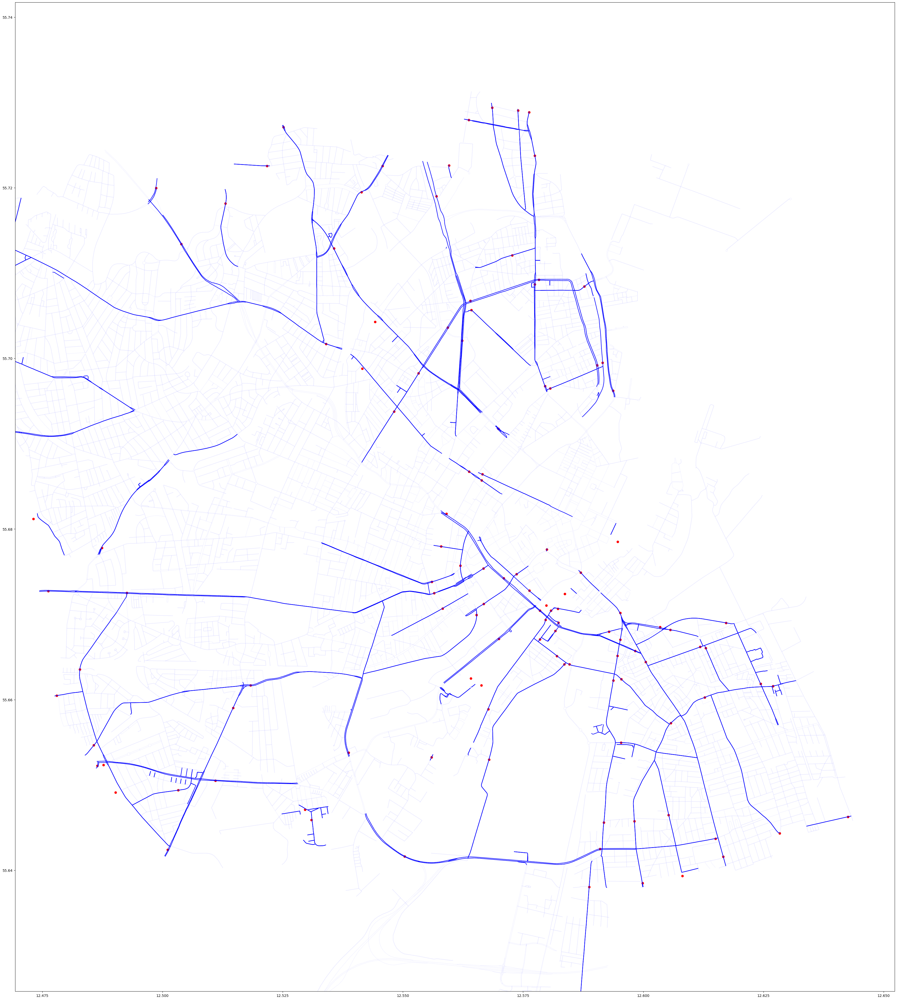

In [6]:
G_carall = ox.load_graphml('../../bikenwgrowth_external/data/copenhagen/bikedata/G_carall_graphml.graphml')

lanes = ox.graph_to_gdfs(G_carall, nodes=False)
world = gpd.read_file(gpd.datasets.get_path('naturalearth_lowres'))

ec = ['b' if (edges_dict[k]) ==meancount else 'blue' for k in edges_dict]
ac = [0.04 if (edges_dict[k]) == meancount else 1.0 for k in edges_dict]

ax = world[world.name == "Copenhagen municipality"].plot(color='black', edgecolor='black', figsize=(50,50),bgcolor = 'black')
bikelanes.plot(ax=ax, color='red')
lanes.plot(ax=ax, color=ec, alpha= ac)
#bikelanes2.plot(ax=ax, color='red', alpha = 0.3,linestyle=(0,(5,10)))



plt.axis([12.469380, 12.652281, 55.625802, 55.741728])


plt.show()

### Plotting nearest edges and bicycle counter locations together

/Users/Kristof/opt/anaconda3/envs/OSMNX/lib/python3.8/site-packages/geopandas/plotting.py:693: UserWarning: The GeoDataFrame you are attempting to plot is empty. Nothing has been displayed.
  warnings.warn(


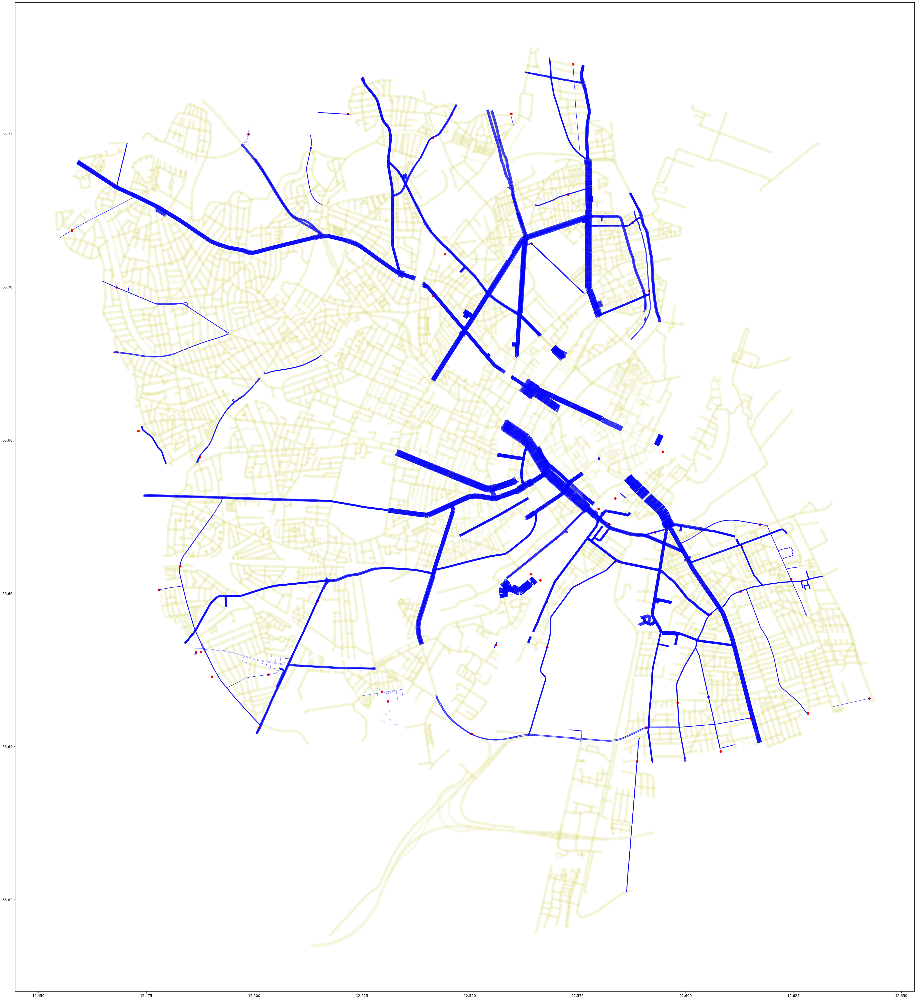

In [9]:
#Showing edges and nodes where fraction of bicycle count determines the size, so the thicker the line the more trafficated
lanes = ox.graph_to_gdfs(G_carall, nodes=False)
world = gpd.read_file(gpd.datasets.get_path('naturalearth_lowres'))
ax = world[world.name == "Copenhagen municipality"].plot(color='black', edgecolor='black', figsize=(50,50),bgcolor = 'black')

ec = ['y' if (edges_dict[k]) == meancount else 'blue' for k in edges_dict]
ac = [0.08 if (edges_dict[k]) == meancount else 0.8 for k in edges_dict]
#lc = [3 if (edges_dict[k]) == meancount else (edges_dict[k])/1000 for k in edges_dict]
lc = [(edges_dict[k])/1000 for k in edges_dict]

bikelanes.plot(ax=ax, color='red')
lanes.plot(ax=ax, color=ec, alpha= ac, linewidth = lc)


plt.show()

## Betweenness and normalisation

In [10]:
betweenness = nx.edge_betweenness_centrality(G_carall,  weight='bc_len-attr')

In [11]:
betweenness2 = nx.edge_betweenness_centrality(G_carall,  weight='length')

In [12]:
with open("../../bikenwgrowth_external/data/copenhagen/bikedata/betweenness_bc_len_attr.pickle", 'wb') as f:
    pickle.dump(betweenness, f)
    
with open("../../bikenwgrowth_external/data/copenhagen/bikedata/betweenness_length.pickle", 'wb') as f:
    pickle.dump(betweenness2, f)

In [13]:
print(sorted(betweenness.items(), key=lambda x: x[1], reverse=True)[0:10])

[((1234226337, 1234226427, 0), 0.12277792786315238), ((1234226427, 870375505, 0), 0.12277791077843266), ((870375505, 1234226391, 0), 0.12277789369371293), ((1234226391, 4945354181, 0), 0.12277787660899321), ((4945354181, 1234226398, 0), 0.12277785952427349), ((1234226398, 6640025035, 0), 0.12277784243955377), ((6640025035, 6640025037, 0), 0.12277782535483404), ((6640025037, 6132160521, 0), 0.12277780827011431), ((6132160521, 1234226341, 0), 0.12277779118539459), ((1234226341, 1234226323, 0), 0.12277777410067486)]


In [14]:
print(sorted(betweenness2.items(), key=lambda x: x[1], reverse=True)[0:10])

[((1234226337, 1234226427, 0), 0.09412564854613022), ((1234226427, 870375505, 0), 0.0941256314614105), ((870375505, 1234226391, 0), 0.09412561437669077), ((1234226391, 4945354181, 0), 0.09412559729197105), ((4945354181, 1234226398, 0), 0.09412558020725133), ((1234226398, 6640025035, 0), 0.09412556312253159), ((6640025035, 6640025037, 0), 0.09412554603781187), ((6640025037, 6132160521, 0), 0.09412552895309215), ((6132160521, 1234226341, 0), 0.09412551186837242), ((1234226341, 1234226323, 0), 0.0941254947836527)]


In [15]:
#normalisation

fn = lambda value, x_max, x_min: (value - x_min) / (x_max - x_min)
btw3 = betweenness
# In each inner dict

# find min and max values
max_x = max(betweenness.values())
min_x = min(betweenness.values())

# normalize each value in the dict
for k in betweenness:
    btw3[k] = fn(betweenness[k], max_x, min_x)


In [16]:
#normalisation
btw4 = betweenness2
# In each inner dict

# find min and max values
max_x = max(betweenness2.values())
min_x = min(betweenness2.values())

# normalize each value in the dict
for k in betweenness2:
    btw4[k] = fn(betweenness2[k], max_x, min_x)


In [17]:
with open('../../bikenwgrowth_external/data/copenhagen/bikedata/btw3.pickle', 'wb') as y:
    pickle.dump(btw3, y)

In [18]:
with open('../../bikenwgrowth_external/data/copenhagen/bikedata/btw4.pickle', 'wb') as y:
    pickle.dump(btw4, y)

## Plots

/Users/Kristof/opt/anaconda3/envs/OSMNX/lib/python3.8/site-packages/geopandas/plotting.py:693: UserWarning: The GeoDataFrame you are attempting to plot is empty. Nothing has been displayed.
  warnings.warn(


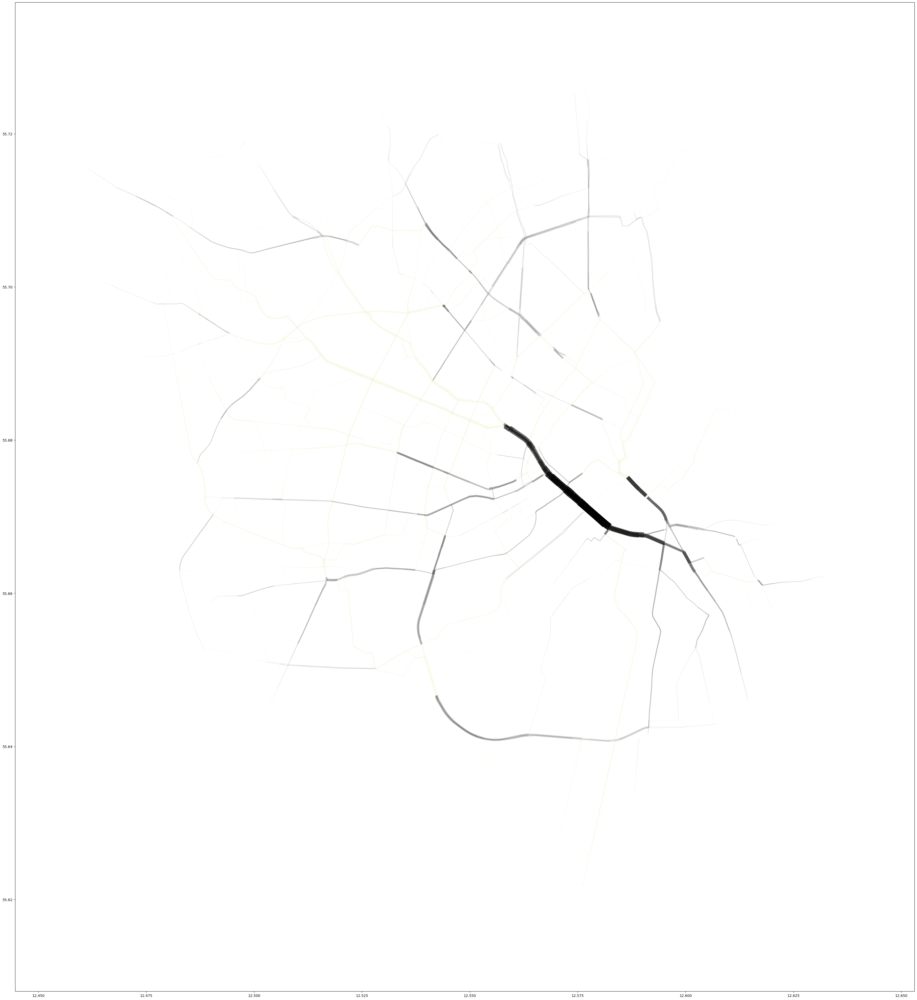

In [19]:
#This plot is edge betweenness centrality based on the 'length' attribute 
lanes = ox.graph_to_gdfs(G_carall, nodes=False)
world = gpd.read_file(gpd.datasets.get_path('naturalearth_lowres'))

ec = ['y' if (edges_dict[k]) == meancount else 'black' for k in edges_dict]
ac = [0.04 if (edges_dict[k]) == meancount else btw4[k] for k in btw4]
#ac = [0.08 if (edges_dict[k]) == meancountfraction else 0.8 for k in edges_dict]
lc = [btw4[k]*20 for k in btw4]

ax = world[world.name == "Copenhagen municipality"].plot(color='black', edgecolor='black', figsize=(50,50),bgcolor = 'black')
#bikelanes.plot(ax=ax, color='red')
lanes.plot(ax=ax, color=ec, alpha= ac, linewidth = lc)


plt.show()

/Users/Kristof/opt/anaconda3/envs/OSMNX/lib/python3.8/site-packages/geopandas/plotting.py:693: UserWarning: The GeoDataFrame you are attempting to plot is empty. Nothing has been displayed.
  warnings.warn(


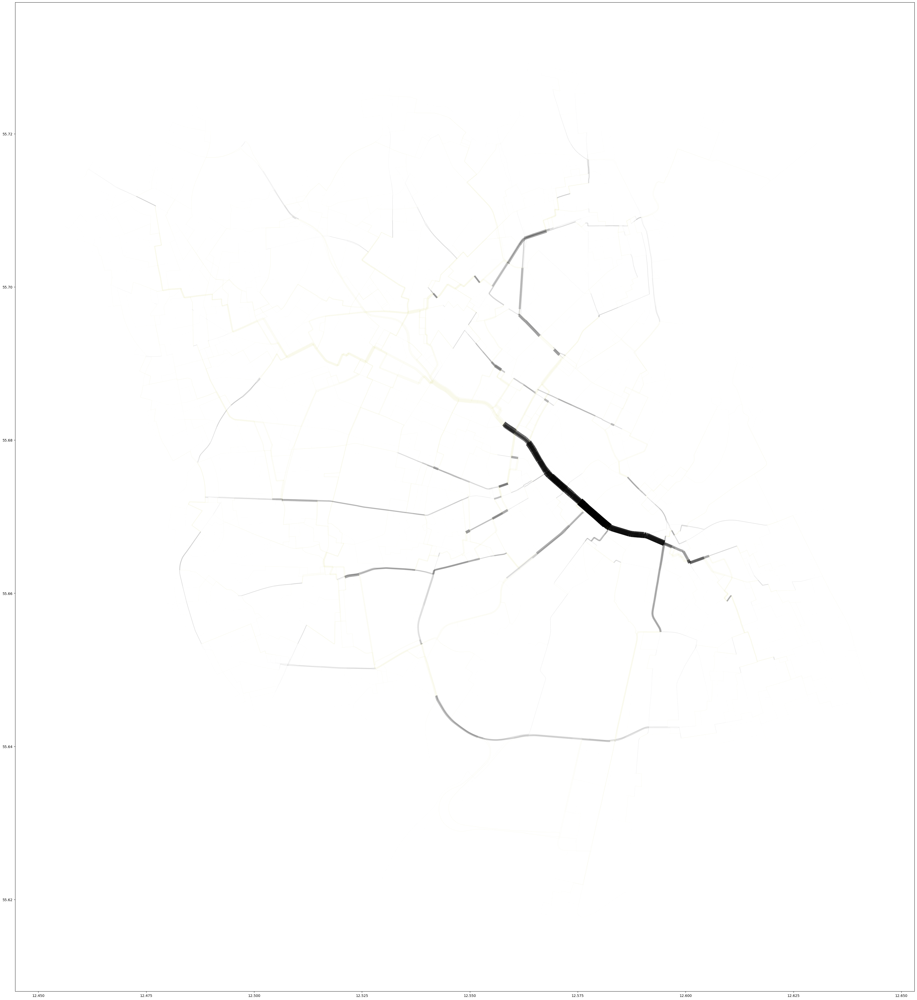

In [20]:
#This plot is edge betweenness centrality based on the 'bc_len_attr' attribute 
lanes = ox.graph_to_gdfs(G_carall, nodes=False)
world = gpd.read_file(gpd.datasets.get_path('naturalearth_lowres'))

ec = ['y' if (edges_dict[k]) == meancount else 'black' for k in edges_dict]
ac = [0.04 if (edges_dict[k]) == meancount else btw3[k] for k in btw3]
#ac = [0.08 if (edges_dict[k]) == meancountfraction else 0.8 for k in edges_dict]
lc = [btw3[k]*20 for k in btw3]

ax = world[world.name == "Copenhagen municipality"].plot(color='black', edgecolor='black', figsize=(50,50),bgcolor = 'black')
#bikelanes.plot(ax=ax, color='red')
lanes.plot(ax=ax, color=ec, alpha= ac, linewidth = lc)


plt.show()

/Users/Kristof/opt/anaconda3/envs/OSMNX/lib/python3.8/site-packages/geopandas/plotting.py:693: UserWarning: The GeoDataFrame you are attempting to plot is empty. Nothing has been displayed.
  warnings.warn(


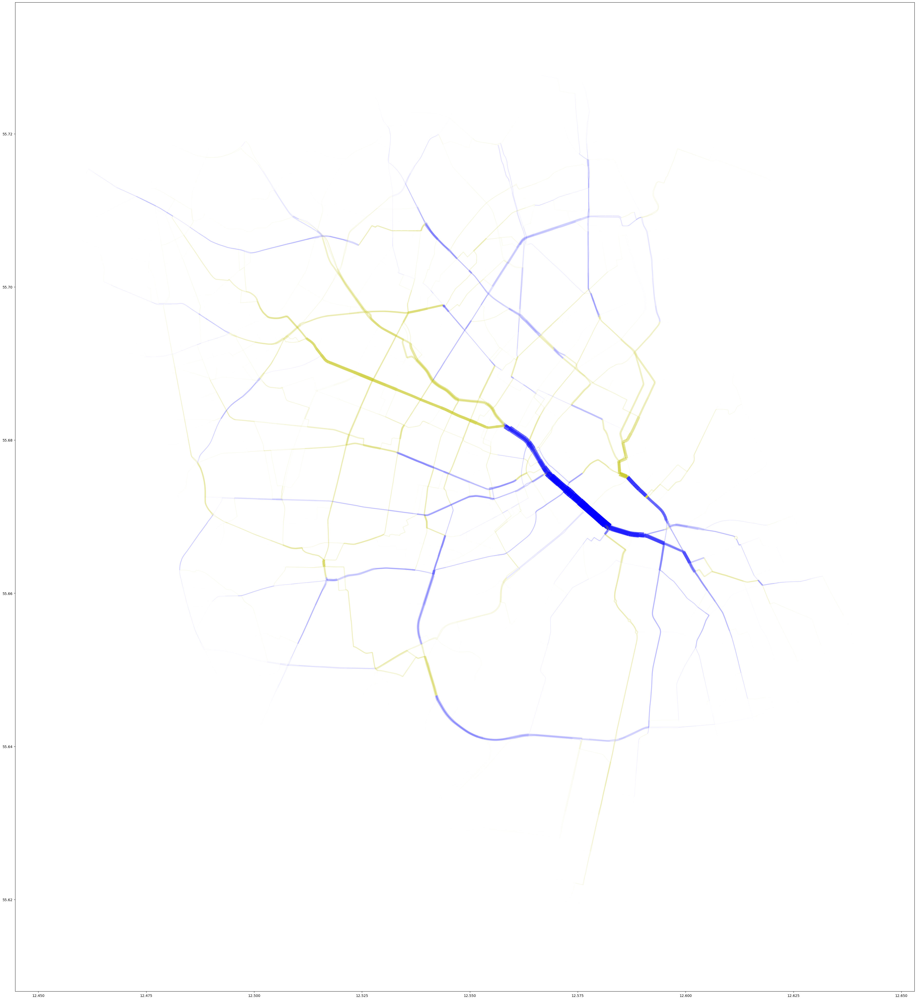

In [25]:
#This plot is edge betweenness centrality based on the 'length' attribute 
lanes = ox.graph_to_gdfs(G_carall, nodes=False)
world = gpd.read_file(gpd.datasets.get_path('naturalearth_lowres'))

ec = ['y' if (edges_dict[k]) == meancount else 'blue' for k in edges_dict]
ac = [ btw4[k] for k in btw4]
#ac = [0.08 if (edges_dict[k]) == meancountfraction else 0.8 for k in edges_dict]
lc = [btw4[k]*20 for k in btw4]

ax = world[world.name == "Copenhagen municipality"].plot(color='black', edgecolor='black', figsize=(50,50),bgcolor = 'black')
#bikelanes.plot(ax=ax, color='red')
lanes.plot(ax=ax, color=ec, alpha= ac, linewidth = lc)


plt.show()

/Users/Kristof/opt/anaconda3/envs/OSMNX/lib/python3.8/site-packages/geopandas/plotting.py:693: UserWarning: The GeoDataFrame you are attempting to plot is empty. Nothing has been displayed.
  warnings.warn(


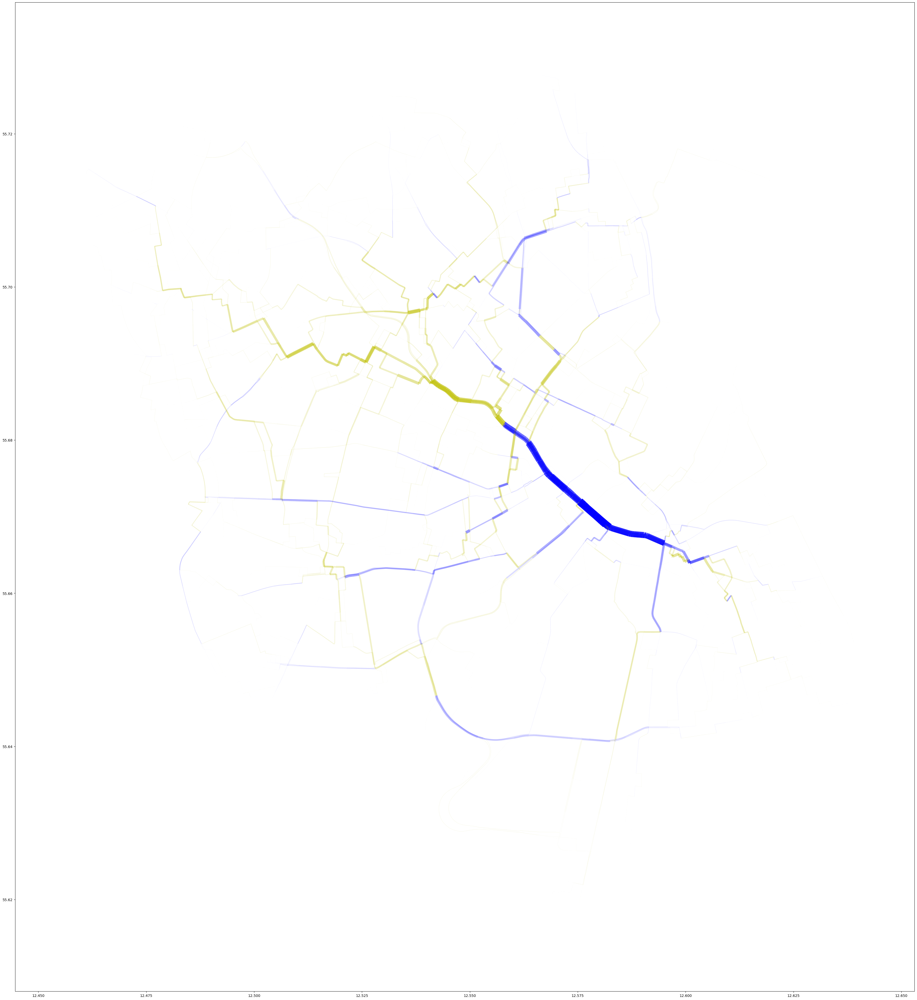

In [28]:
#This plot is edge betweenness centrality based on the 'length' attribute 
lanes = ox.graph_to_gdfs(G_carall, nodes=False)
world = gpd.read_file(gpd.datasets.get_path('naturalearth_lowres'))

ec = ['y' if (edges_dict[k]) == meancount else 'blue' for k in edges_dict]
ac = [ btw3[k] for k in btw3]
#ac = [0.08 if (edges_dict[k]) == meancountfraction else 0.8 for k in edges_dict]
lc = [btw3[k]*20 for k in btw3]

ax = world[world.name == "Copenhagen municipality"].plot(color='black', edgecolor='black', figsize=(50,50),bgcolor = 'black')
#bikelanes.plot(ax=ax, color='red')
lanes.plot(ax=ax, color=ec, alpha= ac, linewidth = lc)


plt.show()

/Users/Kristof/opt/anaconda3/envs/OSMNX/lib/python3.8/site-packages/geopandas/plotting.py:693: UserWarning: The GeoDataFrame you are attempting to plot is empty. Nothing has been displayed.
  warnings.warn(


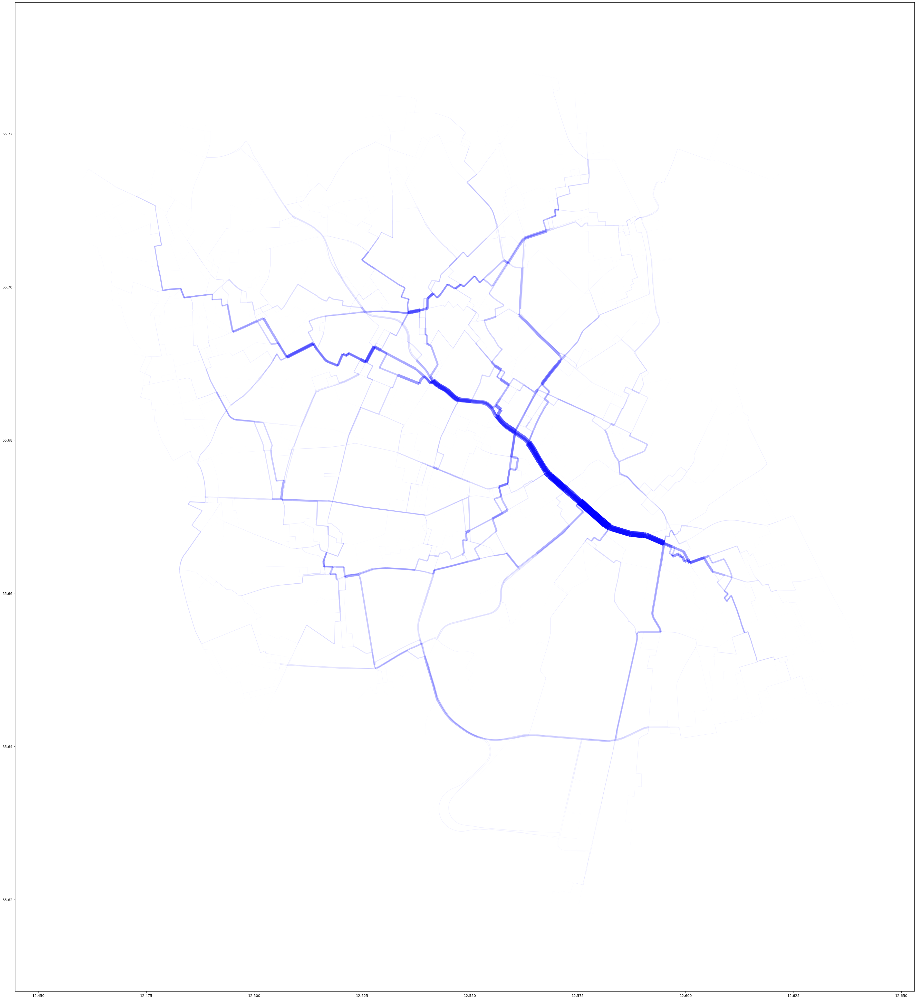

In [22]:
#This plot is edge betweenness centrality based on the 'bc_len_attr' attribute 
lanes = ox.graph_to_gdfs(G_carall, nodes=False)
world = gpd.read_file(gpd.datasets.get_path('naturalearth_lowres'))

ec = ['b' if (edges_dict[k]) == meancount else 'blue' for k in edges_dict]
ac = [btw3[k] for k in btw3]
#ac = [0.08 if (edges_dict[k]) == meancountfraction else 0.8 for k in edges_dict]
lc = [btw3[k]*20 for k in btw3]

ax = world[world.name == "Copenhagen municipality"].plot(color='black', edgecolor='black', figsize=(50,50),bgcolor = 'black')
#bikelanes.plot(ax=ax, color='red')
lanes.plot(ax=ax, color=ec, alpha= ac, linewidth = lc)


plt.show()

/Users/Kristof/opt/anaconda3/envs/OSMNX/lib/python3.8/site-packages/geopandas/plotting.py:693: UserWarning: The GeoDataFrame you are attempting to plot is empty. Nothing has been displayed.
  warnings.warn(


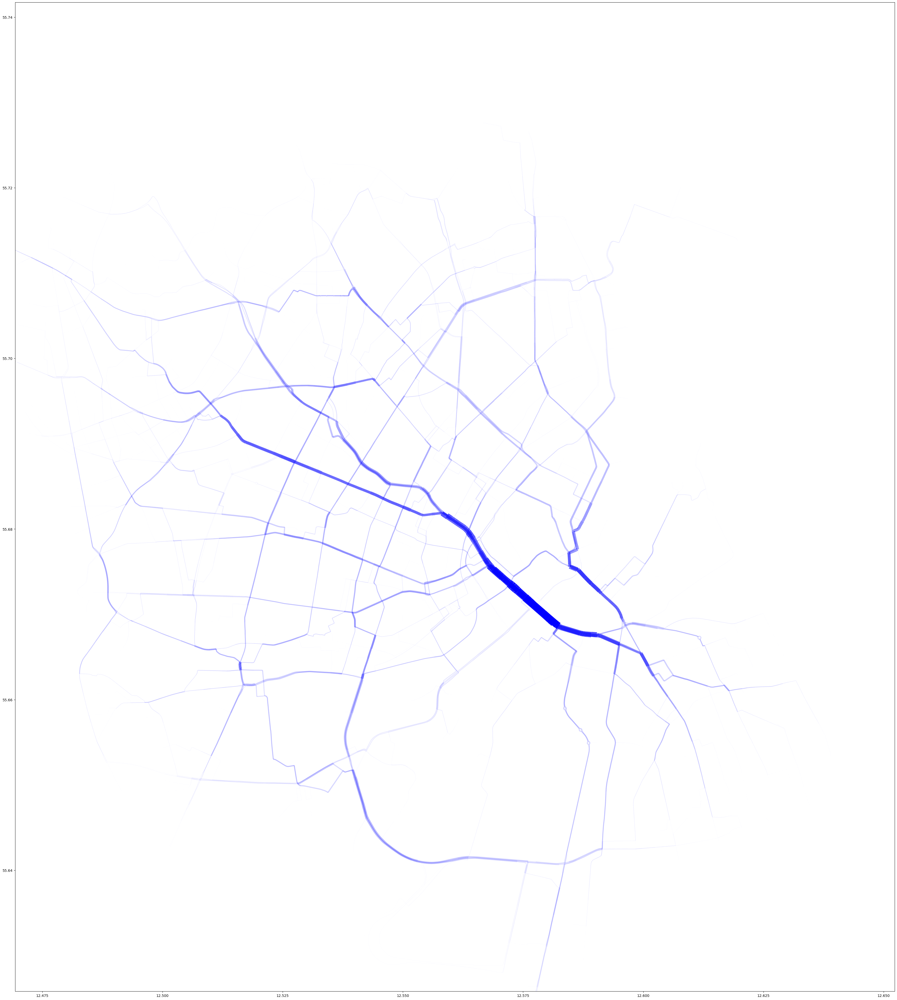

In [29]:
#This plot is edge betweenness centrality based on the 'bc_len_attr' attribute 


lanes = ox.graph_to_gdfs(G_carall, nodes=False)
world = gpd.read_file(gpd.datasets.get_path('naturalearth_lowres'))

ec = ['blue' if (edges_dict[k]) == meancount else 'blue' for k in edges_dict]
ac = [btw4[k] for k in btw4]
#ac = [0.08 if (edges_dict[k]) == meancountfraction else 0.8 for k in edges_dict]
lc = [btw4[k]*20 for k in btw4]

ax = world[world.name == "Copenhagen municipality"].plot(color='black', edgecolor='black', figsize=(50,50),bgcolor = 'black')
#bikelanes.plot(ax=ax, color='red')

lanes.plot(ax=ax, color=ec, alpha= ac, linewidth = lc)
#bikelanes2.plot(ax=ax, color='red', alpha = 0.2,linestyle=(0,(5,10)))



plt.axis([12.469380, 12.652281, 55.625802, 55.741728])


plt.show()

## Graph conversion sketches 

In [ ]:
#fp = "../../bikenwgrowth_external/data/copenhagen/bikedata/graph_G_carall_geopackage.gpkg"
#ox.save_graph_geopackage(G_carall, filepath = fp)

#fp2 = "../../bikenwgrowth_external/data/copenhagen/bikedata/graph_G_carall_graphml.graphml"
#ox.save_graphml(G_carall, fp2)

# Notes


In [ ]:
#ec = ['b' if (edges_dict[k]) ==1.0 else 'y' for k in edges_dict]
#nc = ["r" if Point(G_carall.nodes[node]['y'] , G_carall.nodes[node]['x']) in counterpoints else "y" for node in G_carall.nodes()]
#fig, ax = ox.plot_graph(G_carall, bgcolor = 'black', edge_color=ec, node_color='blue', figsize=(50, 50)) 
#bikelanes.plot(ax=ax, color='white')

In [ ]:
#G_carall_gdfs = ox.graph_to_gdfs(G_carall, edges = False)
#joined = G_carall_gdfs.geometry.append(bikelanes.geometry)
#print(type(joined))
#print(joined)

#print(type(bikelanes))
#print(type(joined))
#envgdf = gpd.GeoDataFrame(geometry=gpd.GeoSeries(joined))
#print(print(len(envgdf)))

#hey = gpd.GeoDataFrame(geometry=gpd.GeoSeries(bikelanes.geometry))
#print(hey['geometry'])

#q = G_carall
#q.add_nodes_from(hey)
# !!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!
#print(len(list(q.nodes())))

#gdf_edges = ox.graph_to_gdfs(q, nodes = False)
#gggg = ox.graph_from_gdfs(envgdf, gdf_edges, graph_attrs=q.graph)
#print(len(list(gggg.nodes())))
#print()
#ox.plot_graph(gggg, bgcolor = 'white', edge_color=ec, node_color='red', figsize=(50, 50)) 

In [ ]:
#print(G_carall.nodes(data = True))

#vallist =[]
#vallist2 =[]
#for val in bikelanes['geometry']:
#    vallist.append((round(val.x,7),round(val.y,7)))

#vallist2 = []
#for x, y in G_carall.nodes(data = True):
#    vallist2.append(tuple(y.values()))
    
#print(list(set(vallist).intersection(set(vallist2))))

In [ ]:
#graph = ox.graph_from_place(["Copenhagen municipality", "Frederiksberg municipality"])
#fig, ax = ox.plot_graph(graph, bgcolor = 'white', edge_color='blue', node_color='red', figsize=(50, 50))
#bikelanes.plot(ax=ax, color='purple')
#plt.tight_layout

#bikelanes.plot(ax=ax, color='purple')
#plt.tight_layout

#city = ox.geocode_to_gdf(["Copenhagen municipality", "Frederiksberg municipality"])
#city_proj = ox.project_gdf(city)
#ax = city_proj.plot(fc="gray", ec="none")
#bikelanes.plot(ax=ax, color='purple')
#ax.axis("off");

#ox.save_graphml(G_carall, "../../bikenwgrowth_external/data/copenhagen/bikedata/graph_no_bicycle_count.graphml")
# getting graph from fil
#G_carall = ox.load_graphml('../../bikenwgrowth_external/data/copenhagen/bikedata/graph_no_bicycle_count.graphml')

#fp = "../../bikenwgrowth_external/data/copenhagen/bikedata/graph_bicycle_count_fraction_values.gpkg"
#ox.save_graph_geopackage(G_carall, fp)
# load GeoPackage as node/edge GeoDataFrames indexed as described in OSMnx docs
#save_graphml1(G_carall, "../../bikenwgrowth_external/data/copenhagen/bikedata/graph_bicycle_count_fraction_values.graphml")
# getting graph from fil
#G3 = ox.load_graphml('../../bikenwgrowth_external/data/copenhagen/bikedata/graph_bicycle_count_fraction_values.graphml')

In [ ]:
Audio(sound_file, autoplay=True)

In [ ]:
print(len(bikelanes))